


**By: Nupur Mittal**

# Supermarket Sales Prediction Using Machine Learning

# Introduction and Summary of the Project

Sales are the lifeblood of a business. It's what helps business pay employees, cover operating expenses, buy more inventory, market new products and attract more investors. Sales prediction is a crucial part of the financial planning of a business. It's a self-assessment tool that uses past and current sales statistics to intelligently predict future performance.One simple sales forecast can inform every other aspect of the business.When a company constantly misses its sales forecast it can have a negative impact on its valuation over the long term. When the business cannot estimate how much revenue they will generate accurately, they can’t hire or invest to keep with the growth and that could lead to several missed opportunities. Decision makers rely on these predictions to plan for business expansion and to determine how to fuel the company’s growth. So, in many ways, sales prediction affects everyone in the organization.If a company predicts robust sales in the fourth quarter but only earns half that amount, it's a sign to stockholders that not only is the company performing poorly, but management is clueless. When attracting new investors to a private company, sales forecasts can be used to predict the potential return on investment.The overall effect of accurate sales forecasting is a business that runs more efficiently, saving money on excess inventory, increasing profit and serving its customers better.

Therefore the main objective of this project is to work on the anonymous supermarket sales dataset obtained from Kaggle and identify and visualize which factors contribute to the sales generation as well as to build a prediction model that will perform the regression task, compare the models and identify which model will provide the best sales prediction results and at last perform causal inference to understand what causes high or low sales generation for the supermarket. This dataset contains total 1000 rows and 17 attributes. The target variable is Total.

**There are eight continuous variables:**

-Unit price: Price of each product in $

-Quantity: Number of products purchased by customer

-Tax 5 percent tax fee for customer buying

-Total: Total price including tax

-COGS: Cost of goods sold

-Gross margin percentage: Gross margin percentage

-Gross income: Gross income

-Rating: Customer stratification rating on their overall shopping experience (On a scale of 1 to 10)


**There are nine categorical variables:**


-Invoice id: Computer generated sales slip invoice identification number

-Branch: Branch of supercenter (3 branches are available identified by A, B and C).

-City: Location of supercenters

-Customer type: Type of customers, recorded by Members for customers using member card and Normal for without member card.

-Gender: Gender type of customer

-Product line: General item categorization groups - Electronic accessories, Fashion accessories, Food and beverages, Health and beauty, Home and lifestyle, Sports and travel

-Date: Date of purchase (Record available from January 2019 to March 2019)

-Time: Purchase time (10am to 9pm)

-Payment: Payment used by customer for purchase (3 methods are available – Cash, Credit card and Ewallet)


The analysis have been performed in the below steps:

**-Exploratory Analysis**

**-Data Preprocessing and Preparation**

**-Training,tuning and evaluating machine learning models**

**-Causal Inference**

**Exploratory Analysis:**

In order to identify patterns that can yield to total sales generation, exploratory analysis was performed on the dataset. The bar graphs, histograms and boxplots were made and some useful insights were drawn and explained in the notebook below. I created two three attributes Day,Hour,Month to identify the sales trend on a daily, monthly and hourly basis.


**Data Preprocessing and Preparation:**

There was no missing data.

The variables such as Invoice ID did not have any predictive power as these were unuique to the customers and therefore was removed from the analysis. Similarly the attributes like gross margin percentage was removed since it had only one value for all the rows and Date and Time were also removed since they did not have any predictive power and I already converted date into day, hour and month tgo understand the sales trend, therefore to avoid duplicacy Date and Time attributes were removed.

The categorical variables were dummyfied using the label encoding and one hot encoding methods. The correlation matrix was formed in order to understand if there are any variables which are high colliear. From the matrix it was observed that there City was highly correlated with Branch and Tax 5 percent,cogs, gross income were highly correlated with Total sales so these variables were removed from the analysis to avoid multi collinearity issues.

The training and testing data was then standardised to ensure that each input variable has the same range so that the effect on the model is similar and the variable such as Total and Unit price that has greater ranges does not have larger influence on the model's results

After this, the feature selection process was performed using Lasso, RFE and Random forest methods to select the predictors which play a significant role in explaining the variation between X and Y better. The features that came out to be less useful for the prediction purpose were "Payment_Credit card","Product line_Food and beverages","Product line_Electronic accessories","Product line_Health and beauty" as based on their RFE rankings, Lasso cofficients(zero) and Random Forest Gini coefficients. Therefore, for the modelling purpose these useless predictors were removed from the analysis.


**Training,tuning and evaluating machine learning models:**

Since this was a regression task, I tested and applied four regressions models which were Linear Regression, Random Forest Regressor, Gradient Boosting Regressor and XG Boost Regressor to analyse and comapre MSE,RMSE and MAE scores obtained by each of them.

To improve the overall performance of the model, I tuned the algorithms hyperparameters using GridSearchCV.

Models were built on the selected features and after the application of various models, it was found that Gradient Boosting Model generated the minimum RMSE of 10.64 with optimal hyperparameters as compared to other models.It also has the lowest MSE and MAE scores which makes it a perfect model for prediction of sales.

The GBT model also highlighted two most important features when it comes to sales prediction of a supermarket. Quantity plays an important role, where if people are buying large amount of quantity of the products that may lead to high generation of sales in different branches. Similarly, Unit price is the second most important feature, which may imply that the price of product plays an important role in the sales generation and people percieve any product with the low price there is a higher chance that they would buy it more and generate more sales, on the other hand it can also be possible that some premium products which have a higher unit price may be percievd as good quality products and that could lead to higher sales generation.

**Causal Inference**

I made the hypothesis to check the effect of each variable (21 after dummifying) on Total sales. I created different models for each causal effect analysis with different treatments each time.

From the analysis it was observed that only three variables have the significant positive causal effect on total sales which were Quantity, Unit price and Customer type whereas Cash Payment had the significant negative causal effect on the total sales.

**Business Benefit:** The Gradient Boosting Model built in this project would proof very helpful to the supermarket as they will be able to predict the supermarket sales accurately with lowest MSE (113) and RMSE(10.64) efficiently with least variation. This would ensure that the company is able to build strategies on improving the product, launching new products, increasing the payment options, increasing the quantity of the most popular and highly demanded products or manage the unit price of different types of products and offer different schemes on periodic intervals to different types of customers whether member or normal and male or female. The higher the sales are generated, means higher profitability for the firm and more customer base and better reputation of the supermarket in the retail market. The model also depicts that there is a direct causal relationship between Quantity, Unit price and Customer type, this will definitely provide a useful insight to the business where they can make strategies to improve their customer base by providing better offers and schemes as well as build pricing and supply strategies for different types of products in different branches and locations and based on customer preferences.

# Setup

In [6]:
#Import packages and libraries

In [287]:
pip install pandas-profiling

In [288]:
pip install yellowbrick

Note: you may need to restart the kernel to use updated packages.


In [289]:
pip install janitor

Note: you may need to restart the kernel to use updated packages.


In [1]:
import warnings
import gc
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
import pandas_profiling
import calendar
from seaborn import pairplot
from sklearn import (
    ensemble,
    model_selection,
    preprocessing,
    tree
)
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    cross_val_score,
    cross_val_predict
)
from yellowbrick.classifier import (
    ConfusionMatrix,
    ROCAUC
)
from yellowbrick.model_selection import (
    LearningCurve 
)
from imblearn.over_sampling import (
    SMOTE, ADASYN
)
from seaborn import diverging_palette

from pandas_profiling import ProfileReport

# import library for visualisations
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
from IPython.display import Image

from pandas.plotting import scatter_matrix

# Data Import and Profiling

In [3]:
sales = pd.read_csv("supermarket_sales.csv")

In [4]:
sales.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [5]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Invoice ID               1000 non-null   object 
 1   Branch                   1000 non-null   object 
 2   City                     1000 non-null   object 
 3   Customer type            1000 non-null   object 
 4   Gender                   1000 non-null   object 
 5   Product line             1000 non-null   object 
 6   Unit price               1000 non-null   float64
 7   Quantity                 1000 non-null   int64  
 8   Tax 5%                   1000 non-null   float64
 9   Total                    1000 non-null   float64
 10  Date                     1000 non-null   object 
 11  Time                     1000 non-null   object 
 12  Payment                  1000 non-null   object 
 13  cogs                     1000 non-null   float64
 14  gross margin percentage  

In [6]:
sales.shape

(1000, 17)

In [7]:
sales.columns

Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Date',
       'Time', 'Payment', 'cogs', 'gross margin percentage', 'gross income',
       'Rating'],
      dtype='object')

In [8]:
sales.isnull().sum()

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64

In [298]:
profile = ProfileReport(sales)

profile

# Data Exploration

Text(0, 0.5, 'Data type')

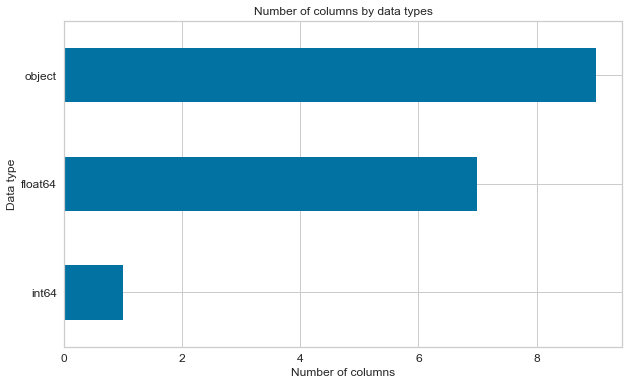

In [9]:
# Count of each type of column
sales.dtypes.value_counts().sort_values().plot(kind='barh',figsize=(10, 6),fontsize=12)
plt.title('Number of columns by data types', fontsize=12)
plt.xlabel('Number of columns', fontsize=12)
plt.ylabel('Data type', fontsize=12)

In [10]:
#number of categories in each column
sales.select_dtypes('object').apply(pd.Series.nunique, axis=0)

Invoice ID       1000
Branch              3
City                3
Customer type       2
Gender              2
Product line        6
Date               89
Time              506
Payment             3
dtype: int64

In [11]:
# checking if the data is imbalanced and the distribution of categorical data

def vcounts(sales,colname):
    a = sales[colname].value_counts()
    return a

In [12]:
vcounts(sales,"Branch")

A    340
B    332
C    328
Name: Branch, dtype: int64

In [13]:
vcounts(sales,"City")

Yangon       340
Mandalay     332
Naypyitaw    328
Name: City, dtype: int64

In [14]:
vcounts(sales,"Customer type")

Member    501
Normal    499
Name: Customer type, dtype: int64

In [15]:
vcounts(sales,"Gender")

Female    501
Male      499
Name: Gender, dtype: int64

In [16]:
vcounts(sales,"Product line")

Fashion accessories       178
Food and beverages        174
Electronic accessories    170
Sports and travel         166
Home and lifestyle        160
Health and beauty         152
Name: Product line, dtype: int64

In [17]:
vcounts(sales,"Payment")

Ewallet        345
Cash           344
Credit card    311
Name: Payment, dtype: int64

In [18]:
# dealing with date and time

sales['Date'] = pd.to_datetime(sales['Date'])

sales['Day'] = (sales['Date']).dt.day
sales['Month'] = (sales['Date']).dt.month

sales['Month'] = sales['Month'].apply(lambda x: calendar.month_name[x])

sales['Time'] = pd.to_datetime(sales['Time'])
sales['Hour'] = (sales['Time']).dt.hour

In [19]:
sales.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,Day,Month,Hour
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,2021-02-15 13:08:00,Ewallet,522.83,4.761905,26.1415,9.1,5,January,13
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,2021-02-15 10:29:00,Cash,76.40,4.761905,3.8200,9.6,8,March,10
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,2021-02-15 13:23:00,Credit card,324.31,4.761905,16.2155,7.4,3,March,13
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,2021-02-15 20:33:00,Ewallet,465.76,4.761905,23.2880,8.4,27,January,20
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,2021-02-15 10:37:00,Ewallet,604.17,4.761905,30.2085,5.3,8,February,10


In [20]:
sales.describe()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,Day,Hour
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1.000000e+03,1000.000000,1000.00000,1000.000000,1000.000000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905e+00,15.379369,6.97270,15.256000,14.910000
std,26.494628,2.923431,11.708825,245.885335,234.17651,6.220360e-14,11.708825,1.71858,8.693563,3.186857
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905e+00,0.508500,4.00000,1.000000,10.000000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905e+00,5.924875,5.50000,8.000000,12.000000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905e+00,12.088000,7.00000,15.000000,15.000000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905e+00,22.445250,8.50000,23.000000,18.000000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905e+00,49.650000,10.00000,31.000000,20.000000


In [21]:
sales.mean()

Unit price                  55.672130
Quantity                     5.510000
Tax 5%                      15.379369
Total                      322.966749
cogs                       307.587380
gross margin percentage      4.761905
gross income                15.379369
Rating                       6.972700
Day                         15.256000
Hour                        14.910000
dtype: float64

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,Day,Hour
Unit price,1.000000e+00,1.077756e-02,6.339621e-01,6.339621e-01,6.339621e-01,-6.998957e-16,6.339621e-01,-8.777507e-03,5.702090e-02,8.242210e-03
Quantity,1.077756e-02,1.000000e+00,7.055102e-01,7.055102e-01,7.055102e-01,-3.849075e-16,7.055102e-01,-1.581490e-02,-4.334686e-02,-7.316886e-03
Tax 5%,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,2.461896e-16,1.000000e+00,-3.644170e-02,-2.514770e-03,-2.770440e-03
Total,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,2.408632e-16,1.000000e+00,-3.644170e-02,-2.514770e-03,-2.770440e-03
cogs,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.439279e-15,1.000000e+00,-3.644170e-02,-2.514770e-03,-2.770440e-03
gross margin percentage,-6.998957e-16,-3.849075e-16,2.461896e-16,2.408632e-16,1.439279e-15,1.000000e+00,2.461896e-16,2.042714e-15,-4.999832e-16,-2.114722e-16
gross income,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,2.461896e-16,1.000000e+00,-3.644170e-02,-2.514770e-03,-2.770440e-03
Rating,-8.777507e-03,-1.581490e-02,-3.644170e-02,-3.644170e-02,-3.644170e-02,2.042714e-15,-3.644170e-02,1.000000e+00,-7.075821e-03,-3.058764e-02
Day,5.702090e-02,-4.334686e-02,-2.514770e-03,-2.514770e-03,-2.514770e-03,-4.999832e-16,-2.514770e-03,-7.075821e-03,1.000000e+00,2.066810e-02
Hour,8.242210e-03,-7.316886e-03,-2.770440e-03,-2.770440e-03,-2.770440e-03,-2.114722e-16,-2.770440e-03,-3.058764e-02,2.066810e-02,1.000000e+00


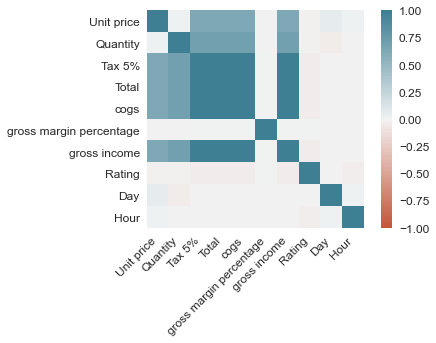

In [22]:
#checking correlations

data_corr = sales.corr()

ax = sns.heatmap(
   data_corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),square=True,
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

data_corr

In [23]:
#data_corr.to_csv(r"C:\Users\Nupur\OneDrive - McGill University\Desktop\McGill Notes\INSY695075\correlations.csv")

In [24]:
data_corr["Total"].sort_values(ascending=False)

Total                      1.000000e+00
cogs                       1.000000e+00
gross income               1.000000e+00
Tax 5%                     1.000000e+00
Quantity                   7.055102e-01
Unit price                 6.339621e-01
gross margin percentage    2.408632e-16
Day                       -2.514770e-03
Hour                      -2.770440e-03
Rating                    -3.644170e-02
Name: Total, dtype: float64

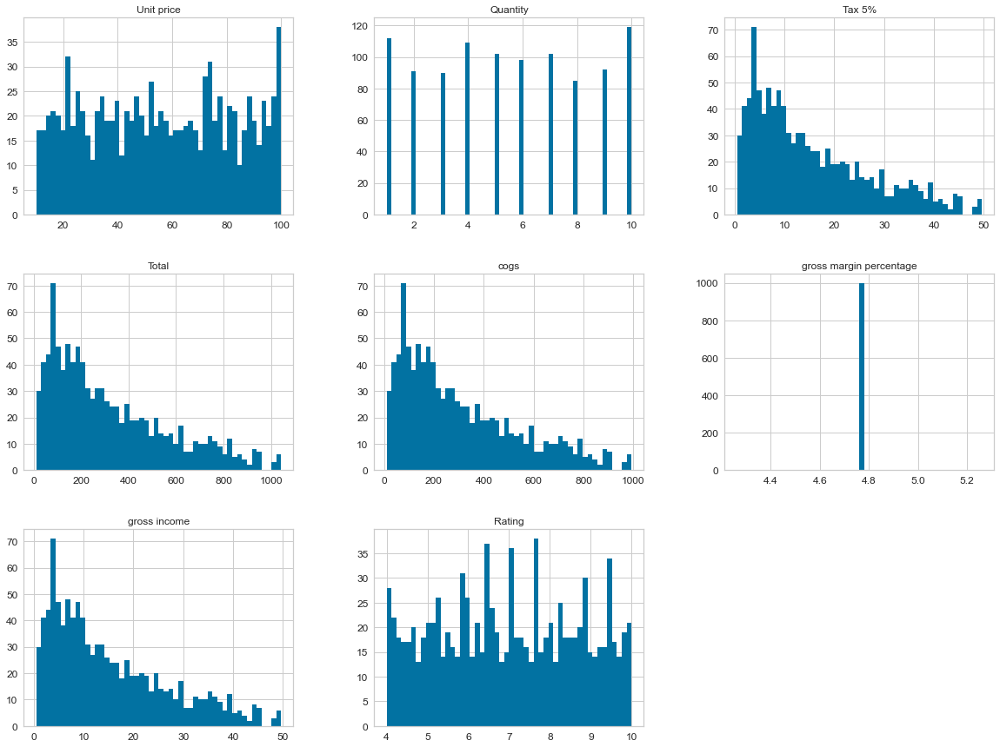

In [315]:
#histograms of continuous variables
attributes = ["Unit price","Quantity","Tax 5%","Total","cogs","gross margin percentage","gross income","Rating"]
%matplotlib inline
import matplotlib.pyplot as plt
sales[attributes].hist(bins=50, figsize=(20,15))
plt.show()

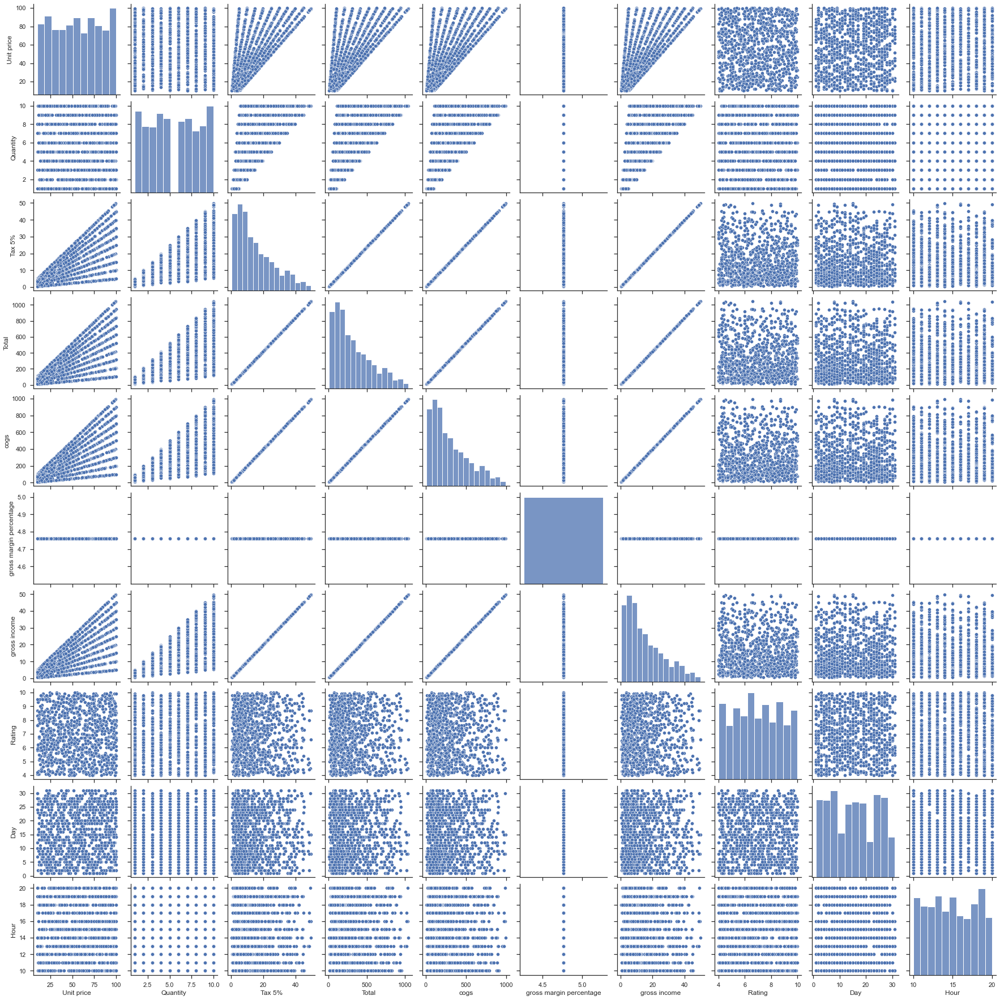

In [26]:
sns.pairplot(sales)

In [317]:
sales.dtypes

Invoice ID                         object
Branch                             object
City                               object
Customer type                      object
Gender                             object
Product line                       object
Unit price                        float64
Quantity                            int64
Tax 5%                            float64
Total                             float64
Date                       datetime64[ns]
Time                       datetime64[ns]
Payment                            object
cogs                              float64
gross margin percentage           float64
gross income                      float64
Rating                            float64
Day                                 int64
Month                              object
Hour                                int64
dtype: object

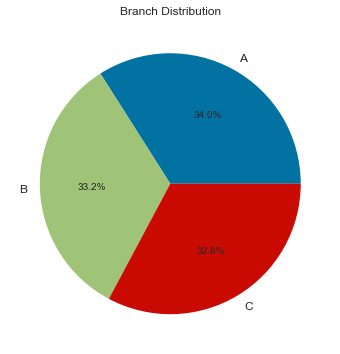

In [318]:
#Branch Distribution
plt.figure(figsize = (12,6))
branch = sales.Branch.value_counts().reset_index()
plt.pie(branch.Branch, labels = branch['index'],autopct='%1.1f%%')
plt.title("Branch Distribution")
plt.show()

*From the distribution it is clearly observed that the supermarket has maximum number of branch A as compared to B and C.*

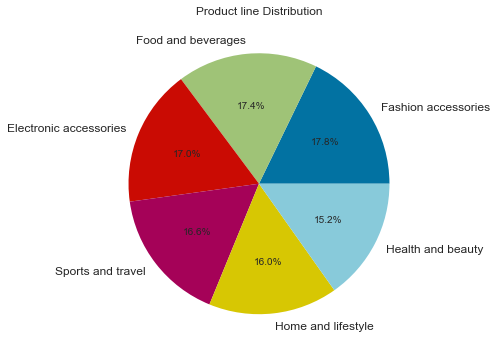

In [319]:
#Product line Distribution
plt.figure(figsize = (12,6))
productline = sales["Product line"].value_counts().reset_index()
plt.pie(productline["Product line"], labels = productline['index'],autopct='%1.1f%%')
plt.title("Product line Distribution")
plt.show()

*From the pie chart it was observed that fashion accessories were the most popular product in all the branches, food and beverages stands second and electronic accessories comes third in the product category*

<AxesSubplot:xlabel='Gender'>

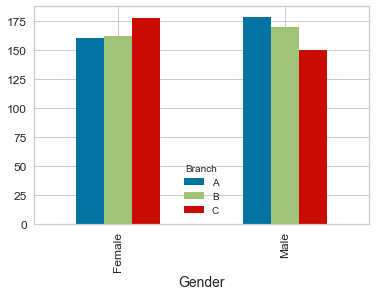

In [320]:
#Distribution of Gender across branches
sales.groupby(['Branch','Gender']).size().unstack(0).plot.bar()

*Higher number of females buy products from Branch C as compared to males who buy most of the products from Branch A and B. This implies that Branch C is more popular among females and Branch A and B are more popular among males.*

Text(0.5, 1.0, 'Ratings by Branch')

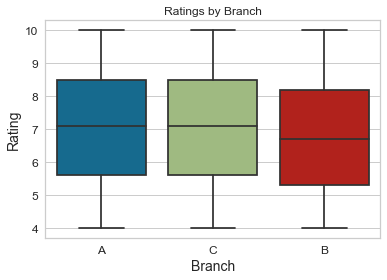

In [321]:
#Ratings of the branches
sns.boxplot(x="Branch", y ="Rating" ,data =sales).set_title("Ratings by Branch")

*Branch B has the lowest rating among all other branches and Branch A and C have equal rating*

<AxesSubplot:xlabel='Customer type'>

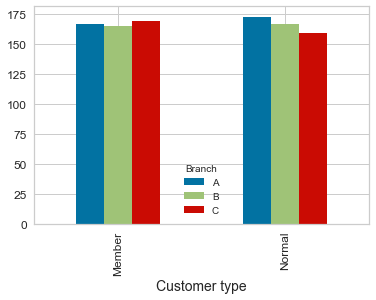

In [322]:
#Distribution of Customer type across branches

sales.groupby(['Branch','Customer type']).size().unstack(0).plot.bar()

*The Member customers buy most of their poroducts from Branch C and least from Branch B whereas Normal customers purchase heavily from Branch A and then B but least from Branch C*

<AxesSubplot:xlabel='count', ylabel='Product line'>

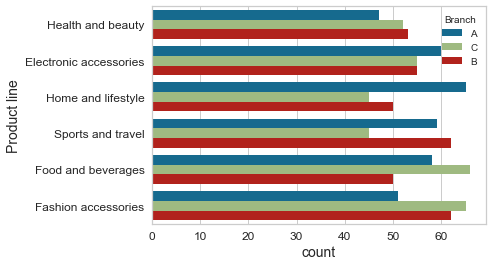

In [323]:
# sales of different product lines in different branches

sns.countplot(y='Product line',hue='Branch',data=sales)

*From the barplot we can observe that in Branch A, Home and lifestyle items are sold the most. In Branch B, Sports and travel and Fashion accessories are mostly sold whereas in Branch C, Food Beverages and Fashion accessories are maximum sold*

<AxesSubplot:xlabel='Total', ylabel='Product line'>

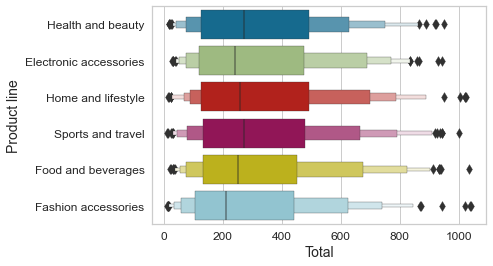

In [377]:
#Sales of different products
sns.boxenplot(y = 'Product line', x = 'Total', data=sales )

*From the above visual, Health and Beauty,Sports and travel generate more total sales than Electronic accessories, Home and lifestyle, food and beverages and fashion accessories.*

<AxesSubplot:xlabel='Rating', ylabel='Product line'>

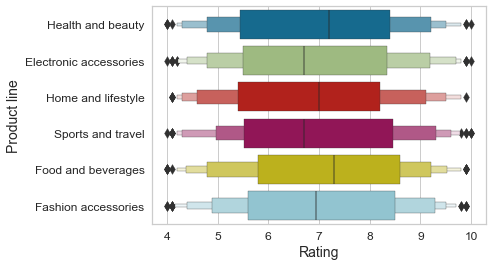

In [378]:
#ratings of the products
sns.boxenplot(y = 'Product line', x = 'Rating', data=sales )

*Health and Beauty and food and beverages have higher rating as compared to other products. The least rating was observed for electronic accessories and sport and travel items*

<AxesSubplot:xlabel='Total', ylabel='Product line'>

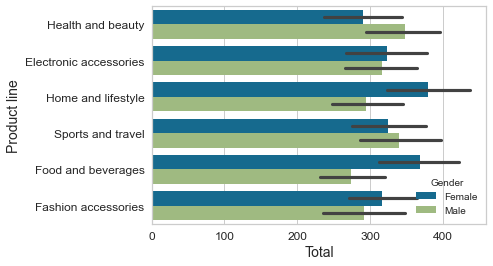

In [379]:
#Sales of products segregated by Gender
sns.barplot(x='Total',hue='Gender',y = 'Product line',data=sales)

*Females prefer tot shop for Home and lifestyle items and generate the maximum sales of around 380 dollars whereas males are more inclined to shop for Health and beauty products and generated maximum sales of around 350 dollars*

<AxesSubplot:xlabel='Quantity', ylabel='Product line'>

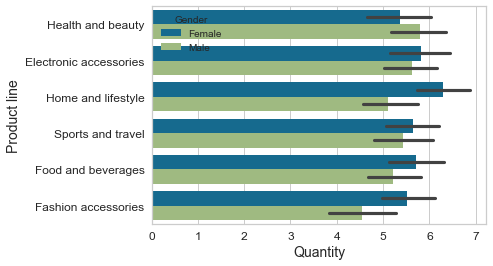

In [380]:
#Quantity of products segregated by Gender
sns.barplot(x='Quantity',hue='Gender',y = 'Product line',data=sales)

*As observed previously in total sales, Females prefer to shop for Home and lifestyle items and that is why they purchase maximum quantity(6.3) of this product whereas males are more inclined to shop for Health and beauty products and they purchased maximum quantity of around 5.7*

<AxesSubplot:xlabel='Unit price', ylabel='Product line'>

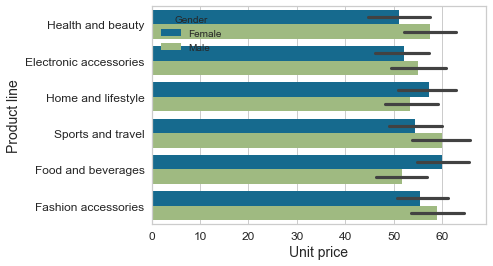

In [381]:
#Priceof products segregated by Gender
sns.barplot(x='Unit price',hue='Gender',y = 'Product line',data=sales)

*This depicts that males and females don't want to compromise on the quality of sports and travel products as well as food and beverages products, so they are buying these products in maximum even though these products have higher unit price.*

<AxesSubplot:xlabel='Total', ylabel='Product line'>

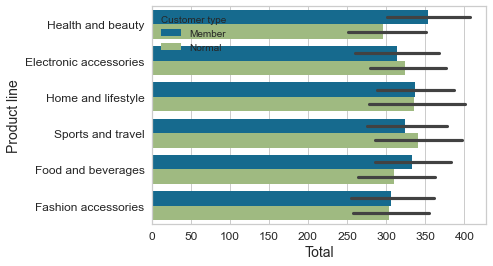

In [382]:
#Sales of products segregated by Customer Type
sns.barplot(x='Total',hue='Customer type',y = 'Product line',data=sales)

*Members prefer to buy more of health and beauty products and generated maximum sales of about 350 dollars whereas Normal customers prefer sports and travel products and generated maximum sales of about 340 dollars*

<AxesSubplot:xlabel='Quantity', ylabel='Product line'>

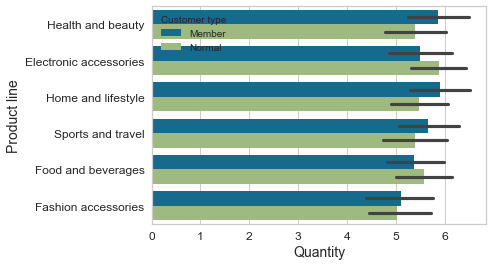

In [383]:
#Quantity of products segregated by Customer Type

sns.barplot(x='Quantity',hue='Customer type',y = 'Product line',data=sales)

*Members prefer to buy more quantity of health and beauty products and home and lifestyle products whereas Normal customers prefer electronic accessories*

<AxesSubplot:xlabel='Unit price', ylabel='Product line'>

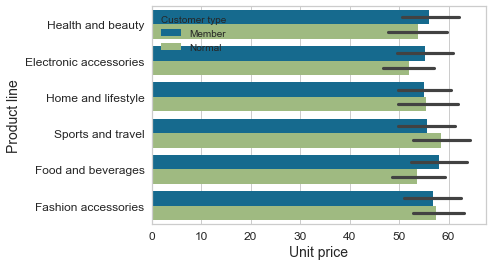

In [384]:
#Price of products segregated by Customer type
sns.barplot(x='Unit price',hue='Customer type',y = 'Product line',data=sales)

*This depicts that members and normal customers don't want to compromise on the quality of sports and travel products as well as food and beverages products, so they are buying these products in maximum even though these products have higher unit price.*

<AxesSubplot:xlabel='Total', ylabel='Product line'>

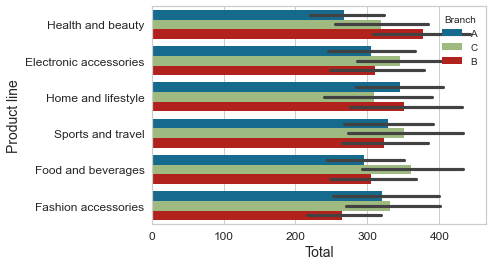

In [385]:
#Total sales of products per branch
sns.barplot(x='Total',hue='Branch',y = 'Product line',data=sales)

*In Branch A the maximum sales are generated by home and lifestyle products, in Branch B, Health and beauty products generates the maximum sales and in Branch C food and beverages generated maximum sales*

<AxesSubplot:xlabel='Total', ylabel='Product line'>

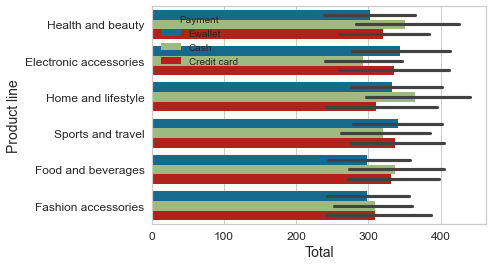

In [386]:
#Total sales of products for each payment type
sns.barplot(x='Total',hue='Payment',y = 'Product line',data=sales)

*Mostly customers purchase electronic accessories using e-waalet which generates maximum sales of about 350 dollars. Customers prefer to purchase home and lifestyle products through cash and generates maximum sales of about 360 dollars. The credit card is mostly famous for the shopping of electronic accessories and sports and travel and generates maximum sales for these products due to credit card purchase.*

<AxesSubplot:xlabel='Total', ylabel='Branch'>

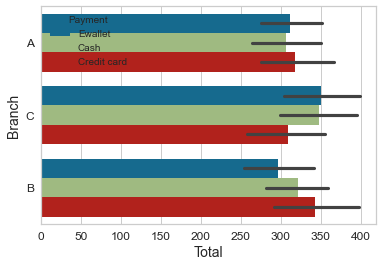

In [387]:
#Sales in Each branch by Payment type
sns.barplot(x='Total',hue='Payment',y = 'Branch',data=sales)

*In Branch A, the maximum sales are generated through Credit card payments, In Branch B, it is through E-wallet payments and in Branch C it is through credit card payments*

<AxesSubplot:xlabel='Gender', ylabel='Total'>

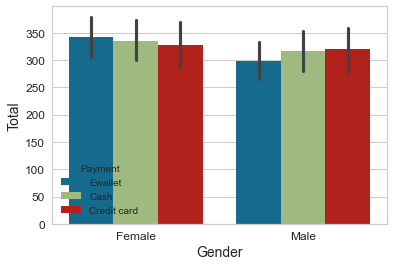

In [388]:
#Sales generated by Gender through payment types
sns.barplot(y='Total',hue='Payment',x = 'Gender',data=sales)

*Females prefer to purchase itmes using e-wallet and generate maximum sales of about 348 dollars whereas males prefer to shop by credit cards and generate maximim sales of about 330 dollars*

<AxesSubplot:xlabel='Customer type', ylabel='Total'>

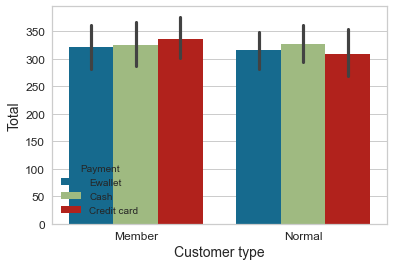

In [389]:
#Sales generated by Customer Type through payment types

sns.barplot(y='Total',hue='Payment',x = 'Customer type',data=sales)

*Members prefer to purchase itmes using credit card and generate maximum sales of about 345 dollars whereas normal customers prefer to shop by cash and generate maximim sales of about 330 dollars*

Text(0.5, 1.0, 'Hourly sales')

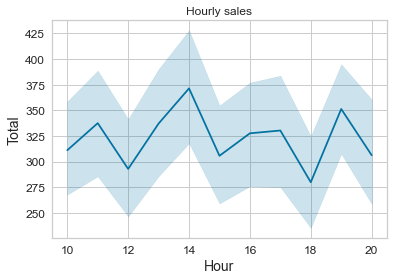

In [390]:
#Hourly Sales

sns.lineplot(x="Hour",  y = 'Total',data =sales).set_title("Hourly sales")

Text(0.5, 1.0, 'Hourly Quantity')

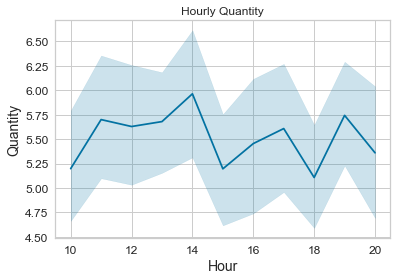

In [391]:
#Hourly Quantity
sns.lineplot(x="Hour",  y = 'Quantity',data =sales).set_title("Hourly Quantity")

*Most of the items were sold around 14:00 hrs local time*

Text(0.5, 1.0, 'Daily sales')

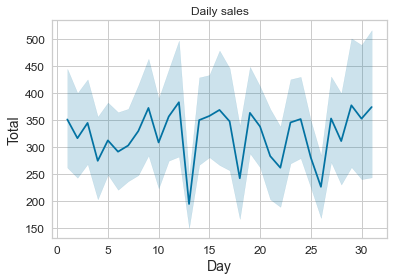

In [392]:
#Daily Sales
sns.lineplot(x="Day",  y = 'Total',data =sales).set_title("Daily sales")

Text(0.5, 1.0, 'Daily Quantity')

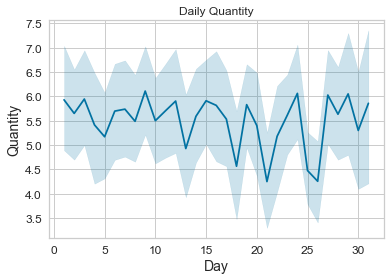

In [393]:
#Daily Quantity

sns.lineplot(x="Day",  y = 'Quantity',data =sales).set_title("Daily Quantity")

*Most of the sale sare generates in around 28 days*

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Text(0.5, 1.0, 'Monthly sales')

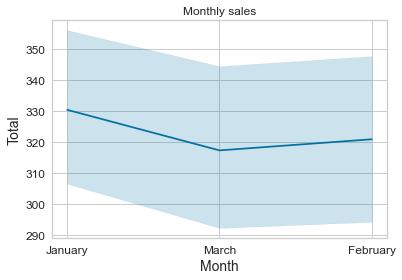

In [394]:
#Monthly Sales
sns.lineplot(x="Month",  y = 'Total',data =sales).set_title("Monthly sales")

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Text(0.5, 1.0, 'Monthly Quantity')

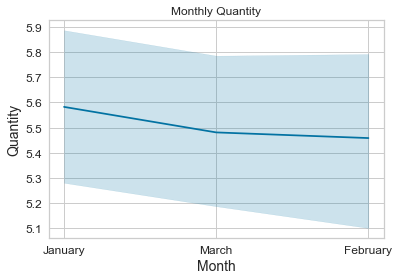

In [395]:
#Monthly Quantity
sns.lineplot(x="Month",  y = 'Quantity',data =sales).set_title("Monthly Quantity")

*Maximum sales are generated in the month of January with a big drop in March and slight increase in February*

# Data Preparation

In [27]:
# Removing variables from the data which don't have any predictive power

sales_clean = sales.drop(columns=["Invoice ID","Date","Time","gross margin percentage"])

In [28]:
sales_clean.head()

,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Payment,cogs,gross income,Rating,Day,Month,Hour
0,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,Ewallet,522.83,26.1415,9.1,5,January,13
1,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,Cash,76.40,3.8200,9.6,8,March,10
2,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,Credit card,324.31,16.2155,7.4,3,March,13
3,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,Ewallet,465.76,23.2880,8.4,27,January,20
4,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,Ewallet,604.17,30.2085,5.3,8,February,10


In [347]:
sales_clean.dtypes

Branch            object
City              object
Customer type     object
Gender            object
Product line      object
Unit price       float64
Quantity           int64
Tax 5%           float64
Total            float64
Payment           object
cogs             float64
gross income     float64
Rating           float64
Day                int64
Month             object
Hour               int64
dtype: object

In [29]:
#Splitting Features into binary, numeric and categorical

binary_feature = sales_clean.nunique()[sales_clean.nunique() == 2].keys().tolist()

In [30]:
binary_feature

['Customer type', 'Gender']

In [31]:
numeric_feat = sales_clean.drop(columns = ["Branch","City","Customer type","Gender","Product line","Payment","Month"])

In [32]:
numeric_feat.columns

Index(['Unit price', 'Quantity', 'Tax 5%', 'Total', 'cogs', 'gross income',
       'Rating', 'Day', 'Hour'],
      dtype='object')

In [33]:
cat_feat = sales_clean[["Branch","City","Customer type","Gender","Product line","Payment","Month"]]

In [34]:
cat_feat.columns

Index(['Branch', 'City', 'Customer type', 'Gender', 'Product line', 'Payment',
       'Month'],
      dtype='object')

In [35]:
# Feature Engineering by dummyfying the binary and categorical variables
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in binary_feature:
    sales_clean[i] = le.fit_transform(sales_clean[i])

In [355]:
#One-hot encoding the rest of categorical columns\
sales_clean = pd.get_dummies(sales_clean)

In [356]:
sales_clean.head()

,Customer type,Gender,Unit price,Quantity,Tax 5%,Total,cogs,gross income,Rating,Day,...,Product line_Food and beverages,Product line_Health and beauty,Product line_Home and lifestyle,Product line_Sports and travel,Payment_Cash,Payment_Credit card,Payment_Ewallet,Month_February,Month_January,Month_March
0,0,0,74.69,7,26.1415,548.9715,522.83,26.1415,9.1,5,...,0,1,0,0,0,0,1,0,1,0
1,1,0,15.28,5,3.8200,80.2200,76.40,3.8200,9.6,8,...,0,0,0,0,1,0,0,0,0,1
2,1,1,46.33,7,16.2155,340.5255,324.31,16.2155,7.4,3,...,0,0,1,0,0,1,0,0,0,1
3,0,1,58.22,8,23.2880,489.0480,465.76,23.2880,8.4,27,...,0,1,0,0,0,0,1,0,1,0
4,1,1,86.31,7,30.2085,634.3785,604.17,30.2085,5.3,8,...,0,0,0,1,0,0,1,1,0,0


,Customer type,Gender,Unit price,Quantity,Tax 5%,Total,cogs,gross income,Rating,Day,...,Product line_Food and beverages,Product line_Health and beauty,Product line_Home and lifestyle,Product line_Sports and travel,Payment_Cash,Payment_Credit card,Payment_Ewallet,Month_February,Month_January,Month_March
Customer type,1.000000,0.039996,-0.020238,-0.016763,-0.019670,-0.019670,-0.019670,-0.019670,0.018889,0.034124,...,-0.036011,0.017559,-0.015494,-0.020608,0.018289,-0.069946,0.049835,-0.048730,0.018225,0.028799
Gender,0.039996,1.000000,0.015445,-0.074258,-0.049451,-0.049451,-0.049451,-0.049451,0.004800,0.051157,...,-0.014909,0.067695,0.006328,-0.025984,-0.023813,-0.031061,0.054042,-0.053082,0.001474,0.049835
Unit price,-0.020238,0.015445,1.000000,0.010778,0.633962,0.633962,0.633962,0.633962,-0.008778,0.057021,...,0.005836,-0.013072,-0.005854,0.022257,0.029721,-0.032415,0.001865,0.023901,0.012437,-0.035601
Quantity,-0.016763,-0.074258,0.010778,1.000000,0.705510,0.705510,0.705510,0.705510,-0.015815,-0.043347,...,-0.006084,0.015709,0.027446,0.004912,0.000403,0.006203,-0.006443,-0.011565,0.018258,-0.007163
Tax 5%,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
Total,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
cogs,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
gross income,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
Rating,0.018889,0.004800,-0.008778,-0.015815,-0.036442,-0.036442,-0.036442,-0.036442,1.000000,-0.007076,...,0.037546,0.007540,-0.034351,-0.014658,-0.001114,0.011935,-0.010509,0.037842,0.019271,-0.055945
Day,0.034124,0.051157,0.057021,-0.043347,-0.002515,-0.002515,-0.002515,-0.002515,-0.007076,1.000000,...,-0.002897,0.017338,-0.048331,-0.017784,0.021304,-0.035954,0.013722,-0.105823,0.154916,-0.053339


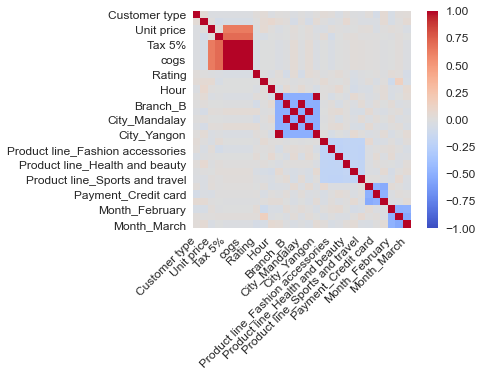

In [357]:
# detecting correlations between variables
data_corr2 = sales_clean.corr()

ax = sns.heatmap(
   data_corr2, 
    vmin=-1, vmax=1, center=0,
    cmap = "coolwarm",square=True,
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

data_corr2

In [358]:
data_corr2["Total"].sort_values(ascending=False)

Total                                  1.000000
cogs                                   1.000000
gross income                           1.000000
Tax 5%                                 1.000000
Quantity                               0.705510
Unit price                             0.633962
City_Naypyitaw                         0.040176
Branch_C                               0.040176
Product line_Home and lifestyle        0.024276
Month_January                          0.022216
Product line_Sports and travel         0.016517
Payment_Cash                           0.009474
Payment_Credit card                    0.002852
Product line_Health and beauty         0.001165
Product line_Food and beverages       -0.000551
Day                                   -0.002515
Hour                                  -0.002770
Month_February                        -0.005663
Product line_Electronic accessories   -0.006140
Branch_B                              -0.008876
City_Mandalay                         -0

In [359]:
# removing highly correlated variables

sales_clean = sales_clean.drop(columns = ["Tax 5%","cogs","gross income","City_Mandalay","City_Naypyitaw","City_Yangon"])

In [360]:
sales_clean.columns

Index(['Customer type', 'Gender', 'Unit price', 'Quantity', 'Total', 'Rating',
       'Day', 'Hour', 'Branch_A', 'Branch_B', 'Branch_C',
       'Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel', 'Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
      dtype='object')

# Training,Tuning and Building Model

In [361]:
# Creating X and Y variables
X = sales_clean.drop(columns=["Total"])
y = sales_clean["Total"]

In [362]:
#Splitting dataset into training and testing

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=0)

In [363]:
# Standardising training and testing dataset
from sklearn.preprocessing import StandardScaler
standardizer = StandardScaler()
X_train = standardizer.fit_transform(X_train)
X_train = pd.DataFrame(X_train,columns = X.columns)
X_test = standardizer.transform(X_test)
X_test = pd.DataFrame(X_test,columns = X.columns)

# Feature Selection

**Lasso Feature Selection Method**

In [364]:
# Lasso Feature Selection Method

from sklearn.linear_model import Lasso 
model = Lasso(alpha=0.04,random_state=0)
model.fit(X_train,y_train)
model_ldf= pd.DataFrame(list(zip(X_train.columns,model.coef_)),columns=['predictor','coefficient'])
model_ldf

,predictor,coefficient
0,Customer type,1.370618
1,Gender,-2.178444
2,Unit price,151.990204
3,Quantity,171.665796
4,Rating,-7.249468
5,Day,-3.311047
6,Hour,-2.034736
7,Branch_A,-1.097904
8,Branch_B,-0.000000
9,Branch_C,3.924618


**Recursive Feature Elimination Method**

In [365]:
#Recursive Feature Elimination Method
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=0, max_depth = 6)
rfe = RFE(rf, n_features_to_select=10)
model_rfe = rfe.fit(X_train, y_train)
model_rfe_df = pd.DataFrame(list(zip(X_train.columns,model_rfe.ranking_)), columns = ['predictor','ranking'])
model_rfe_df

,predictor,ranking
0,Customer type,5
1,Gender,8
2,Unit price,1
3,Quantity,1
4,Rating,1
5,Day,1
6,Hour,1
7,Branch_A,1
8,Branch_B,1
9,Branch_C,1


**Random Forest Feature Elimination**

In [366]:
# Random Forest Feature Elimination
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=0, max_depth = 6)
model_rf = rf.fit(X_train,y_train)
model_rf.feature_importances_
model_rf_df = pd.DataFrame(list(zip(X.columns,model_rf.feature_importances_)),columns=['predictor','feature importance'])
model_rf_df

,predictor,feature importance
0,Customer type,0.000018
1,Gender,0.000010
2,Unit price,0.481481
3,Quantity,0.517636
4,Rating,0.000278
5,Day,0.000123
6,Hour,0.000134
7,Branch_A,0.000038
8,Branch_B,0.000027
9,Branch_C,0.000036


In [367]:
#Removing useless predictors from training & testing dataset which were depicted from lasso and RFE feature selection methods
X_train = X_train.drop(columns = ["Payment_Credit card","Product line_Food and beverages","Product line_Electronic accessories","Product line_Health and beauty"])
X_test = X_test.drop(columns = ["Payment_Credit card","Product line_Food and beverages","Product line_Electronic accessories","Product line_Health and beauty"])

# **Applying Models**

**Linear Regression**

In [368]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
model_lm = lm.fit(X_train,y_train)
y_test_pred = model_lm.predict(X_test)
from sklearn.metrics import mean_squared_error
lin_mse = mean_squared_error(y_test,y_test_pred)
print("Linear Regression Model MSE: {}".format(lin_mse))
lin_rmse = np.sqrt(lin_mse)
print("Linear Regression Model RMSE: {}".format(lin_rmse))

from sklearn.metrics import mean_absolute_error
lin_mae = mean_absolute_error(y_test,y_test_pred)
print("Linear Regression Model MAE: {}".format(lin_mae))

Linear Regression Model MSE: 6474.634280023708
Linear Regression Model RMSE: 80.46511219170522
Linear Regression Model MAE: 61.61762697265586


In [63]:
#Fine tuning the model using cross val score

from sklearn.model_selection import cross_val_score
lin_scores = cross_val_score(estimator=model_lm,X=X_train,y=y_train,scoring="neg_mean_squared_error",cv=10)
lin_rmse_scores = np.sqrt(-lin_scores)

def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

display_scores(lin_rmse_scores)

Scores: [97.41171886 75.38871268 91.34569922 76.91452726 77.15378754 78.0845969
 86.61196414 79.35056501 84.13554181 85.86974717]
Mean: 83.22668605995082
Standard deviation: 6.8266250522647915


**Random Forest Model**

In [64]:
# Random Forest Model

#Model Built

from sklearn.ensemble import RandomForestRegressor
rf2 = RandomForestRegressor(random_state=0)
modelRF = rf2.fit(X_train,y_train)
y_test_pred2 = modelRF.predict(X_test)
mse_rf = mean_squared_error(y_test,y_test_pred2)
print("Random Forest MSE:{}".format(mse_rf))
rf_rmse = np.sqrt(mse_rf)
print("Random Forest RSE:{}".format(rf_rmse))
rf_mae = mean_absolute_error(y_test,y_test_pred2)
print("Random Forest Model MAE: {}".format(rf_mae))

Random Forest MSE:145.4634917051771
Random Forest RSE:12.06082466936557
Random Forest Model MAE: 7.94505425


In [65]:
#Fine tuning the model using randomised search cv
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
rf3=RandomForestRegressor(random_state=0)
param_grid = { 
    'n_estimators': [100,200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,6,8,10,12],
}

CV_rf3 = GridSearchCV(estimator=rf3, param_grid=param_grid, cv= 10)
rf3_result = CV_rf3.fit(X_train, y_train)
CV_rf3.cv_results_
df_rf3 = pd.DataFrame(CV_rf3.cv_results_)
df_rf3

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_n_estimators,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.156463,0.004101,0.006921,0.003378,4,auto,100,"{'max_depth': 4, 'max_features': 'auto', 'n_es...",0.968629,0.976859,...,0.970444,0.973389,0.968634,0.965111,0.979117,0.973220,0.984058,0.974243,0.006047,9
1,0.303735,0.006821,0.010582,0.000859,4,auto,200,"{'max_depth': 4, 'max_features': 'auto', 'n_es...",0.968308,0.976649,...,0.971064,0.972000,0.966822,0.963967,0.980285,0.972441,0.984010,0.973944,0.006665,10
2,0.112683,0.013826,0.008415,0.002400,4,sqrt,100,"{'max_depth': 4, 'max_features': 'sqrt', 'n_es...",0.599516,0.655155,...,0.662702,0.689470,0.699211,0.588191,0.688650,0.651280,0.675481,0.661846,0.038387,29
3,0.239761,0.025738,0.011366,0.002440,4,sqrt,200,"{'max_depth': 4, 'max_features': 'sqrt', 'n_es...",0.628975,0.670312,...,0.670612,0.706178,0.701864,0.611198,0.701473,0.660467,0.698320,0.676751,0.033478,27
4,0.109766,0.005392,0.006559,0.003455,4,log2,100,"{'max_depth': 4, 'max_features': 'log2', 'n_es...",0.599516,0.655155,...,0.662702,0.689470,0.699211,0.588191,0.688650,0.651280,0.675481,0.661846,0.038387,29
5,0.241258,0.008573,0.013512,0.002933,4,log2,200,"{'max_depth': 4, 'max_features': 'log2', 'n_es...",0.628975,0.670312,...,0.670612,0.706178,0.701864,0.611198,0.701473,0.660467,0.698320,0.676751,0.033478,27
6,0.190643,0.009034,0.007937,0.003061,6,auto,100,"{'max_depth': 6, 'max_features': 'auto', 'n_es...",0.992838,0.996817,...,0.989908,0.994549,0.994241,0.991728,0.994225,0.995601,0.995889,0.994230,0.002086,7
7,0.410385,0.046138,0.013910,0.002417,6,auto,200,"{'max_depth': 6, 'max_features': 'auto', 'n_es...",0.992467,0.996851,...,0.989494,0.994414,0.993844,0.991730,0.994672,0.995612,0.995848,0.994173,0.002239,8
8,0.126582,0.007364,0.007613,0.002466,6,sqrt,100,"{'max_depth': 6, 'max_features': 'sqrt', 'n_es...",0.797996,0.803093,...,0.801371,0.797862,0.834012,0.769184,0.841746,0.791007,0.816373,0.806959,0.020052,25
9,0.247571,0.012048,0.012355,0.001955,6,sqrt,200,"{'max_depth': 6, 'max_features': 'sqrt', 'n_es...",0.807987,0.809328,...,0.805158,0.820916,0.814813,0.768710,0.835729,0.790308,0.814801,0.809571,0.018080,23


In [66]:
rf3_result.best_params_

{'max_depth': 10, 'max_features': 'auto', 'n_estimators': 100}

In [67]:
model_rfr = RandomForestRegressor(max_depth=10,max_features='auto',n_estimators=100)
model_rfr.fit(X_train, y_train)
y_pred_rfr = model_rfr.predict(X_test)
mse_rf2 = mean_squared_error(y_test,y_pred_rfr)
print("Random Forest MSE:{}".format(mse_rf2))
rf2_rmse = np.sqrt(mse_rf2)
print("Random Forest RSE:{}".format(rf2_rmse))
rf2_mae = mean_absolute_error(y_test,y_pred_rfr)
print("Random Forest Model MAE: {}".format(rf2_mae))

Random Forest MSE:163.21905819260107
Random Forest RSE:12.7757214353085
Random Forest Model MAE: 8.463339964402001


**Feature Importance**

In [68]:
# Feature Importance

feature_importances_rfr = rf3_result.best_estimator_.feature_importances_
feature_importances_rfr

array([8.36159577e-05, 1.02514180e-04, 4.81616374e-01, 5.15263216e-01,
       7.82019817e-04, 5.08908574e-04, 5.00020623e-04, 1.10000493e-04,
       9.57765403e-05, 1.68163590e-04, 7.29449763e-05, 8.95006529e-05,
       8.49938124e-05, 9.96718459e-05, 8.68767663e-05, 7.67967652e-05,
       1.13559713e-04, 1.45045918e-04])

In [69]:
def plot_feature_importance(importance,names,model_type):

    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(10,8))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + 'FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')

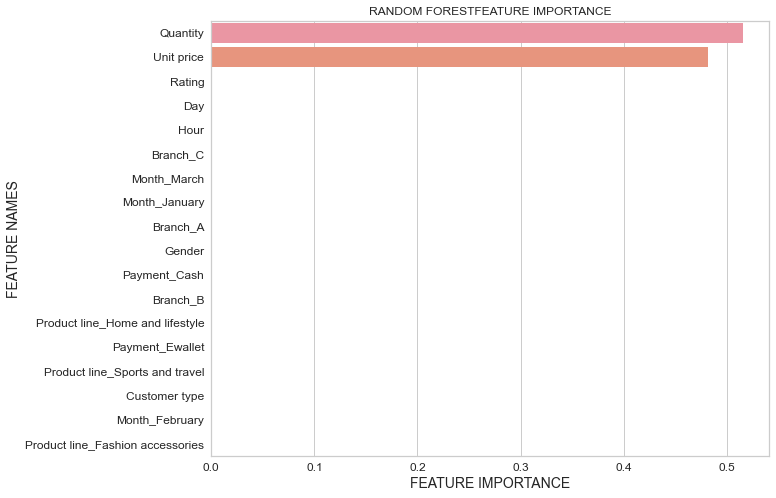

In [70]:
plot_feature_importance(rf3_result.best_estimator_.feature_importances_,X_train.columns,'RANDOM FOREST')

**Gradient Boosting Model**

In [71]:
from sklearn.ensemble import GradientBoostingRegressor
gbt = GradientBoostingRegressor(random_state=0)
model_gbt = gbt.fit(X_train,y_train)
y_pred_gbt = model_gbt.predict(X_test)
mse_gbt = mean_squared_error(y_test,y_pred_gbt)
print("GBT Model MSE:{}".format(mse_gbt))
gbt_rmse = np.sqrt(mse_gbt)
print("GBT Model RMSE:{}".format(gbt_rmse))
gbt_mae = mean_absolute_error(y_test,y_pred_gbt)
print("GBT Model MAE: {}".format(gbt_mae))

GBT Model MSE:113.2923931163694
GBT Model RMSE:10.64388994289068
GBT Model MAE: 7.50179513696214


In [72]:
#fine Tuning the model
from sklearn.ensemble import GradientBoostingRegressor
gbt = GradientBoostingRegressor(random_state=0)
parameters = {
    "learning_rate": [0.01, 0.025, 0.05,],
    "max_depth":[3,5,8],
    "max_features":["log2","sqrt"],
    "n_estimators":[200,500]
    }

clf = GridSearchCV(estimator=gbt, param_grid=parameters, cv=10,verbose = 0)
gbt_result = clf.fit(X_train, y_train)
clf.cv_results_
df_gbt = pd.DataFrame(clf.cv_results_)
df_gbt

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_max_features,param_n_estimators,params,split0_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.089763,0.003653,0.002392,4.856258e-04,0.01,3,log2,200,"{'learning_rate': 0.01, 'max_depth': 3, 'max_f...",0.686939,...,0.720591,0.731142,0.714574,0.649770,0.726150,0.697377,0.713067,0.707704,0.023380,35
1,0.234889,0.009039,0.003091,2.993518e-04,0.01,3,log2,500,"{'learning_rate': 0.01, 'max_depth': 3, 'max_f...",0.888492,...,0.918758,0.918320,0.908756,0.882477,0.914381,0.902777,0.907800,0.905377,0.011280,29
2,0.087582,0.005149,0.001994,2.341363e-06,0.01,3,sqrt,200,"{'learning_rate': 0.01, 'max_depth': 3, 'max_f...",0.686939,...,0.720591,0.731142,0.714574,0.649770,0.726150,0.697377,0.713067,0.707704,0.023380,35
3,0.197393,0.008608,0.002586,4.829185e-04,0.01,3,sqrt,500,"{'learning_rate': 0.01, 'max_depth': 3, 'max_f...",0.888492,...,0.918758,0.918320,0.908756,0.882477,0.914381,0.902777,0.907800,0.905377,0.011280,29
4,0.109308,0.004398,0.002393,4.888798e-04,0.01,5,log2,200,"{'learning_rate': 0.01, 'max_depth': 5, 'max_f...",0.805253,...,0.833921,0.827259,0.838916,0.801669,0.837950,0.814372,0.837890,0.826614,0.013482,33
5,0.267234,0.013429,0.003389,6.646868e-04,0.01,5,log2,500,"{'learning_rate': 0.01, 'max_depth': 5, 'max_f...",0.935536,...,0.955388,0.954589,0.953176,0.944532,0.952461,0.943077,0.957356,0.950602,0.006806,13
6,0.124119,0.009946,0.002492,6.689258e-04,0.01,5,sqrt,200,"{'learning_rate': 0.01, 'max_depth': 5, 'max_f...",0.805253,...,0.833921,0.827259,0.838916,0.801669,0.837950,0.814372,0.837890,0.826614,0.013482,33
7,0.275649,0.021600,0.003191,3.992742e-04,0.01,5,sqrt,500,"{'learning_rate': 0.01, 'max_depth': 5, 'max_f...",0.935536,...,0.955388,0.954589,0.953176,0.944532,0.952461,0.943077,0.957356,0.950602,0.006806,13
8,0.156182,0.001494,0.003188,3.995124e-04,0.01,8,log2,200,"{'learning_rate': 0.01, 'max_depth': 8, 'max_f...",0.836957,...,0.846047,0.863962,0.857062,0.834418,0.869131,0.846307,0.862502,0.854790,0.012153,31
9,0.394920,0.011444,0.005389,9.241529e-04,0.01,8,log2,500,"{'learning_rate': 0.01, 'max_depth': 8, 'max_f...",0.912275,...,0.922670,0.935522,0.927937,0.917179,0.938214,0.920455,0.935654,0.928372,0.009264,19


In [73]:
gbt_result.best_params_

{'learning_rate': 0.05,
 'max_depth': 3,
 'max_features': 'log2',
 'n_estimators': 500}

In [74]:
model_gbt2 = GradientBoostingRegressor(learning_rate=0.05,max_depth=3,max_features='log2',n_estimators=500)
model_gbt2.fit(X_train, y_train)
y_pred_gbt2 = model_gbt2.predict(X_test)
mse_gbt2 = mean_squared_error(y_test,y_pred_gbt)
print("GBT Model MSE:{}".format(mse_gbt2))
gbt_rmse2 = np.sqrt(mse_gbt2)
print("GBT Model RMSE:{}".format(gbt_rmse2))
gbt_mae2 = mean_absolute_error(y_test,y_pred_gbt)
print("GBT Model MAE: {}".format(gbt_mae2))

GBT Model MSE:113.2923931163694
GBT Model RMSE:10.64388994289068
GBT Model MAE: 7.50179513696214


**Feature Importance**

In [75]:
# Feature Importance
feature_importances_gbt = gbt_result.best_estimator_.feature_importances_
feature_importances_gbt

array([8.01305625e-04, 4.32806840e-03, 4.55115966e-01, 4.96354164e-01,
       1.01395548e-02, 1.18957255e-02, 9.30600532e-03, 6.89500798e-04,
       1.07731365e-03, 1.47672955e-03, 8.23251150e-04, 2.62895750e-03,
       3.68451198e-04, 9.36909261e-04, 1.47616365e-03, 8.43684711e-04,
       3.59675816e-04, 1.37857370e-03])

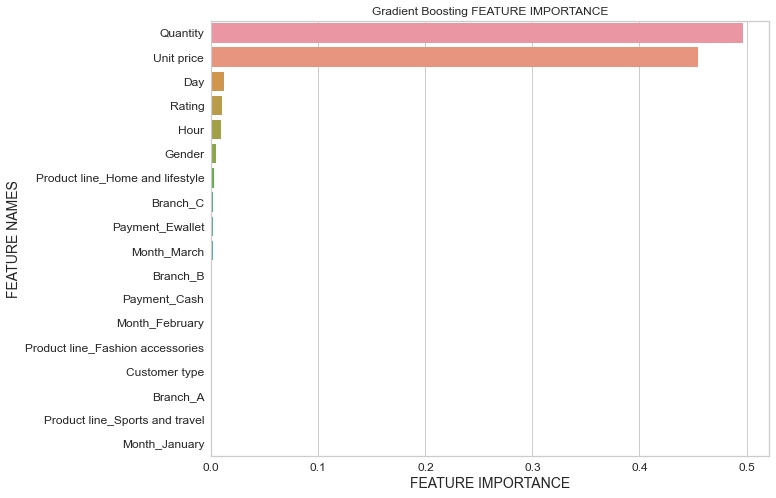

In [76]:
plot_feature_importance(gbt_result.best_estimator_.feature_importances_,X_train.columns,'Gradient Boosting ')

In [3]:
#Summary of scores

df = {'Models': ["Linear Regression","Random Forest Classifier","Gradient Boosting Classifier"],
     'MSE': [6474.63,163.21,113.29],
     'RMSE': [80.46,12.77,10.64],
     'MAE': [31.61,8.46,7.50]}
summary = pd.DataFrame(df)

In [4]:
summary

,Models,MSE,RMSE,MAE
0,Linear Regression,6474.63,80.46,31.61
1,Random Forest Classifier,163.21,12.77,8.46
2,Gradient Boosting Classifier,113.29,10.64,7.50


Text(0, 0.5, 'Models')

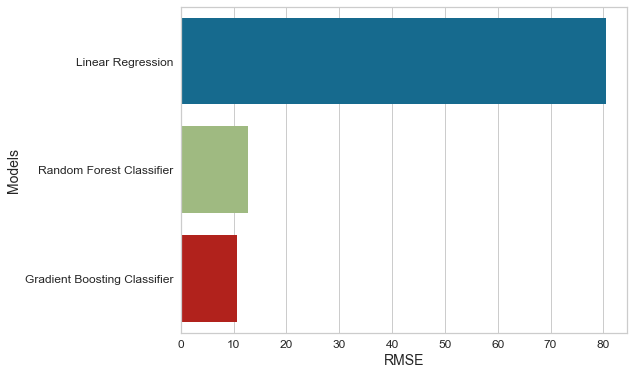

In [5]:
plt.figure(figsize=(8, 6))
splot=sns.barplot(x="RMSE",y="Models",data=summary)
plt.xlabel("RMSE", size=14)
plt.ylabel("Models", size=14)

# Causal Inference

In [47]:
pip install dowhy

Note: you may need to restart the kernel to use updated packages.


In [48]:
conda install -c conda-forge dowhy

Solving environment: ...working... done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [49]:
pip install -r requirements.txt

In [50]:
import dowhy
from dowhy import CausalModel
import dowhy.datasets, dowhy.plotter
import dowhy.api
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

In [51]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


**Creating Causal Models with Treatment and control features and target variable**

In [225]:
#Data Import

sales = pd.read_csv(r"C:\Users\Nupur\OneDrive - McGill University\Desktop\McGill Notes\INSY695075\supermarket_sales.csv")

In [226]:
# dealing with date and time

sales['Date'] = pd.to_datetime(sales['Date'])

sales['Day'] = (sales['Date']).dt.day
sales['Month'] = (sales['Date']).dt.month

sales['Month'] = sales['Month'].apply(lambda x: calendar.month_name[x])

sales['Time'] = pd.to_datetime(sales['Time'])
sales['Hour'] = (sales['Time']).dt.hour


In [227]:
# Removing variables from the data which don't have any predictive power

sales_df = sales.drop(columns=["Invoice ID","Date","Time","gross margin percentage"])

In [228]:
#Splitting Features into binary and categorical

binary_feature = sales_df.nunique()[sales_df.nunique() == 2].keys().tolist()

cat_feat = sales_df[["Branch","City","Customer type","Gender","Product line","Payment","Month"]]


In [229]:
# Feature Engineering by dummyfying the binary and categorical variables
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in binary_feature:
    sales_df[i] = le.fit_transform(sales_df[i])

In [230]:
sales_df = pd.get_dummies(sales_df)

In [231]:
sales_df.head()

,Customer type,Gender,Unit price,Quantity,Tax 5%,Total,cogs,gross income,Rating,Day,...,Product line_Food and beverages,Product line_Health and beauty,Product line_Home and lifestyle,Product line_Sports and travel,Payment_Cash,Payment_Credit card,Payment_Ewallet,Month_February,Month_January,Month_March
0,0,0,74.69,7,26.1415,548.9715,522.83,26.1415,9.1,5,...,0,1,0,0,0,0,1,0,1,0
1,1,0,15.28,5,3.8200,80.2200,76.40,3.8200,9.6,8,...,0,0,0,0,1,0,0,0,0,1
2,1,1,46.33,7,16.2155,340.5255,324.31,16.2155,7.4,3,...,0,0,1,0,0,1,0,0,0,1
3,0,1,58.22,8,23.2880,489.0480,465.76,23.2880,8.4,27,...,0,1,0,0,0,0,1,0,1,0
4,1,1,86.31,7,30.2085,634.3785,604.17,30.2085,5.3,8,...,0,0,0,1,0,0,1,1,0,0


In [232]:
sales_df.columns

Index(['Customer type', 'Gender', 'Unit price', 'Quantity', 'Tax 5%', 'Total',
       'cogs', 'gross income', 'Rating', 'Day', 'Hour', 'Branch_A', 'Branch_B',
       'Branch_C', 'City_Mandalay', 'City_Naypyitaw', 'City_Yangon',
       'Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel', 'Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
      dtype='object')

In [233]:
corr = sales_df.corr()['Total'].sort_values()

# Display correlations
print('Top 10 - Positive Correlations:')
print('-----------------------------------')
print(corr.tail(10))
print('\nTop 10 - Negative Correlations:')
print('------------------------------')
print(corr.head(10))
print('------------------------------')
print(corr)

Top 10 - Positive Correlations:
-----------------------------------
Month_January                      0.022216
Product line_Home and lifestyle    0.024276
Branch_C                           0.040176
City_Naypyitaw                     0.040176
Unit price                         0.633962
Quantity                           0.705510
Tax 5%                             1.000000
gross income                       1.000000
cogs                               1.000000
Total                              1.000000
Name: Total, dtype: float64

Top 10 - Negative Correlations:
------------------------------
Gender                             -0.049451
Rating                             -0.036442
Product line_Fashion accessories   -0.033850
City_Yangon                        -0.030994
Branch_A                           -0.030994
Customer type                      -0.019670
Month_March                        -0.016846
Payment_Ewallet                    -0.012244
City_Mandalay                      -0.00

In [234]:
sales_df['Gender'] = sales_df['Gender'].apply(bool)
sales_df['Customer type'] = sales_df['Customer type'].apply(bool)

In [235]:
sales_df.dtypes

Customer type                             bool
Gender                                    bool
Unit price                             float64
Quantity                                 int64
Tax 5%                                 float64
Total                                  float64
cogs                                   float64
gross income                           float64
Rating                                 float64
Day                                      int64
Hour                                     int64
Branch_A                                 uint8
Branch_B                                 uint8
Branch_C                                 uint8
City_Mandalay                            uint8
City_Naypyitaw                           uint8
City_Yangon                              uint8
Product line_Electronic accessories      uint8
Product line_Fashion accessories         uint8
Product line_Food and beverages          uint8
Product line_Health and beauty           uint8
Product line_

***Assumptions:***

*Since we need to understand what drives the total sales of the company, I have taken the treatments such as customer type, gender, unit price, quantity, rating and hour, which may have correlations with the sales generation in a company.*


*Commom Causes: it represent the variables that according to us have a causal affect on both Outcome and Treatment, so based on my assumption, the common causes could include Branch, payment methods, month as well as product lines along with the treatment variables as mentioned above.*

*Refute: It reruns the analysis by adding randomly drawn covariates to data to check whether the causal estimate changes or not. If my assumption was correct then the causal effect after refutation will not change much as can be seen from the analysis below.*

***Please Note: Since I was facing issues installing pygraphviz therefore I wasn't able to plot the causal effects using graphviz and hence made dotted plots***

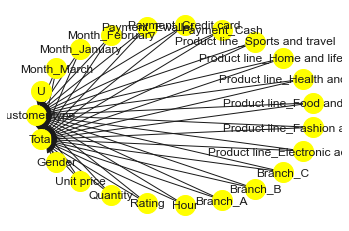

In [264]:
model1= CausalModel(
        data=sales_df,
        treatment='Customer type',
        outcome="Total",
        common_causes=['Gender','Unit price','Quantity','Rating','Hour','Branch_A', 'Branch_B',
       'Branch_C','Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel','Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],instruments=[])
model1.view_model()

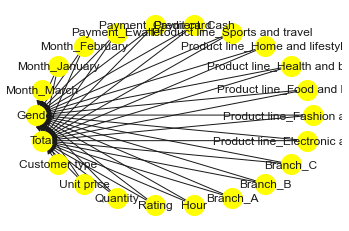

In [265]:
model2= CausalModel(
        data=sales_clean,
        treatment='Gender',
        outcome="Total",
        common_causes=['Customer type','Unit price','Quantity','Rating','Hour','Branch_A', 'Branch_B',
       'Branch_C','Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel','Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],instruments=[])
model2.view_model()

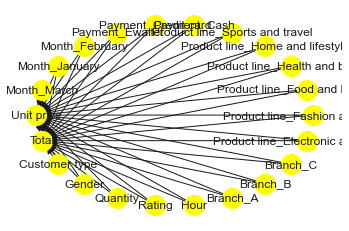

In [266]:
model3= CausalModel(
        data=sales_clean,
        treatment='Unit price',
        outcome="Total",
        common_causes=['Customer type','Gender','Quantity','Rating','Hour','Branch_A', 'Branch_B',
       'Branch_C','Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel','Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
        instruments=[])
model3.view_model()

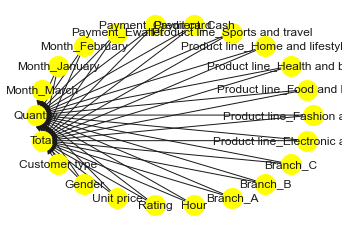

In [267]:
model4= CausalModel(
        data=sales_clean,
        treatment='Quantity',
        outcome="Total",
        common_causes=['Customer type','Gender','Unit price','Rating','Hour','Branch_A', 'Branch_B',
       'Branch_C','Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel','Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
        instruments=[])
model4.view_model()

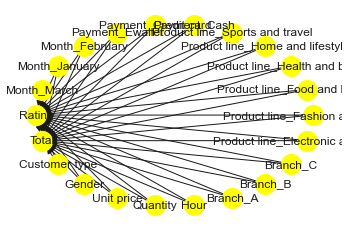

In [268]:
model5= CausalModel(
        data=sales_clean,
        treatment='Rating',
        outcome="Total",
        common_causes=['Customer type','Gender','Unit price','Quantity','Hour','Branch_A', 'Branch_B',
       'Branch_C','Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel','Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
        instruments=[])
model5.view_model()

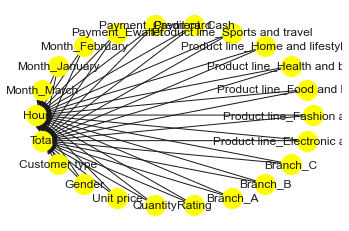

In [269]:
model6= CausalModel(
        data=sales_clean,
        treatment='Hour',
        outcome="Total",
        common_causes=['Customer type','Gender','Unit price','Quantity','Rating','Branch_A', 'Branch_B',
       'Branch_C','Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel','Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
        instruments=[])
model6.view_model()

**Estimation**

In [270]:
identified_estimand1 = model1.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand1)

Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor1 (Default)
Estimand expression:
       d                                                                      
────────────────(Expectation(Total|Branch_C,Rating,Branch_A,Quantity,Hour,Mont
d[Customer type]                                                              

                                                                              
h_February,Product line_Sports and travel,Payment_Cash,Payment_Ewallet,Product
                                                                              

                                                                              
 line_Fashion accessories,Unit price,Product line_Health and beauty,Product li
                                                                              

                                                                              
ne_Electronic accessories,Month_March,Payment_Credit card,Gender,Branch_B,Prod
                     

In [271]:
identified_estimand2 = model2.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand2)

Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor1 (Default)
Estimand expression:
    d                                                                      
─────────(Expectation(Total|Rating,Quantity,Hour,Unit price,Customer type))
d[Gender]                                                                  
Estimand assumption 1, Unconfoundedness: If U→{Gender} and U→Total then P(Total|Gender,Rating,Quantity,Hour,Unit price,Customer type,U) = P(Total|Gender,Rating,Quantity,Hour,Unit price,Customer type)

### Estimand : 2
Estimand name: iv
No such variable found!

### Estimand : 3
Estimand name: frontdoor
No such variable found!



In [272]:
identified_estimand3 = model3.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand3)

Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor1 (Default)
Estimand expression:
      d                                                                    
─────────────(Expectation(Total|Rating,Quantity,Hour,Customer type,Gender))
d[Unit price]                                                              
Estimand assumption 1, Unconfoundedness: If U→{Unit price} and U→Total then P(Total|Unit price,Rating,Quantity,Hour,Customer type,Gender,U) = P(Total|Unit price,Rating,Quantity,Hour,Customer type,Gender)

### Estimand : 2
Estimand name: iv
No such variable found!

### Estimand : 3
Estimand name: frontdoor
No such variable found!



In [273]:
identified_estimand4 = model4.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand4)

Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor1 (Default)
Estimand expression:
     d                                                                     
───────────(Expectation(Total|Rating,Hour,Unit price,Customer type,Gender))
d[Quantity]                                                                
Estimand assumption 1, Unconfoundedness: If U→{Quantity} and U→Total then P(Total|Quantity,Rating,Hour,Unit price,Customer type,Gender,U) = P(Total|Quantity,Rating,Hour,Unit price,Customer type,Gender)

### Estimand : 2
Estimand name: iv
No such variable found!

### Estimand : 3
Estimand name: frontdoor
No such variable found!



In [274]:
identified_estimand5 = model5.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand5)

Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor1 (Default)
Estimand expression:
    d                                                                      
─────────(Expectation(Total|Quantity,Hour,Unit price,Customer type,Gender))
d[Rating]                                                                  
Estimand assumption 1, Unconfoundedness: If U→{Rating} and U→Total then P(Total|Rating,Quantity,Hour,Unit price,Customer type,Gender,U) = P(Total|Rating,Quantity,Hour,Unit price,Customer type,Gender)

### Estimand : 2
Estimand name: iv
No such variable found!

### Estimand : 3
Estimand name: frontdoor
No such variable found!



In [275]:
identified_estimand6 = model6.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand6)

Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor1 (Default)
Estimand expression:
   d                                                                       
───────(Expectation(Total|Quantity,Rating,Unit price,Customer type,Gender))
d[Hour]                                                                    
Estimand assumption 1, Unconfoundedness: If U→{Hour} and U→Total then P(Total|Hour,Quantity,Rating,Unit price,Customer type,Gender,U) = P(Total|Hour,Quantity,Rating,Unit price,Customer type,Gender)

### Estimand : 2
Estimand name: iv
No such variable found!

### Estimand : 3
Estimand name: frontdoor
No such variable found!



**Causal Effects**

In [282]:
estimate1 = model1.estimate_effect(identified_estimand1,method_name="backdoor.linear_regression",test_significance=True)
print(estimate1)
print("Causal Estimate is " + str(estimate1.value))

*** Causal Estimate ***

## Identified estimand
Estimand type: nonparametric-ate

## Realized estimand
b: Total~Customer type+Branch_C+Rating+Branch_A+Quantity+Hour+Month_February+Product line_Sports and travel+Payment_Cash+Payment_Ewallet+Product line_Fashion accessories+Unit price+Product line_Health and beauty+Product line_Electronic accessories+Month_March+Payment_Credit card+Gender+Branch_B+Product line_Food and beverages+Product line_Home and lifestyle+Month_January
Target units: ate

## Estimate
Mean value: 3.2712987828957125
p-value: [0.52986807]

Causal Estimate is 3.2712987828957125


In [288]:
estimate2 = model2.estimate_effect(identified_estimand2,method_name="backdoor.linear_regression",test_significance=True)
print(estimate2)
print("Causal Estimate is " + str(estimate2.value))

*** Causal Estimate ***

## Identified estimand
Estimand type: nonparametric-ate

## Realized estimand
b: Total~Gender+Rating+Quantity+Hour+Unit price+Customer type
Target units: ate

## Estimate
Mean value: -3.5307046790185836
p-value: [0.49704374]

Causal Estimate is -3.5307046790185836


In [289]:
estimate3 = model3.estimate_effect(identified_estimand3,method_name="backdoor.linear_regression",test_significance=True)
print(estimate3)
print("Causal Estimate is " + str(estimate3.value))

*** Causal Estimate ***

## Identified estimand
Estimand type: nonparametric-ate

## Realized estimand
b: Total~Unit price+Rating+Quantity+Hour+Customer type+Gender
Target units: ate

## Estimate
Mean value: 5.814323596110497
p-value: [0.]

Causal Estimate is 5.814323596110497


In [285]:
estimate4 = model4.estimate_effect(identified_estimand4,method_name="backdoor.linear_regression",test_significance=True)
print(estimate4)
print("Causal Estimate is " + str(estimate4.value))

*** Causal Estimate ***

## Identified estimand
Estimand type: nonparametric-ate

## Realized estimand
b: Total~Quantity+Rating+Hour+Unit price+Customer type+Gender
Target units: ate

## Estimate
Mean value: 58.70576201130855
p-value: [0.]

Causal Estimate is 58.70576201130855


In [286]:
estimate5 = model5.estimate_effect(identified_estimand5,method_name="backdoor.linear_regression",test_significance=True)
print(estimate5)
print("Causal Estimate is " + str(estimate5.value))

*** Causal Estimate ***

## Identified estimand
Estimand type: nonparametric-ate

## Realized estimand
b: Total~Rating+Quantity+Hour+Unit price+Customer type+Gender
Target units: ate

## Estimate
Mean value: -2.869202332883617
p-value: [0.05654714]

Causal Estimate is -2.869202332883617


In [287]:
estimate6 = model6.estimate_effect(identified_estimand6,method_name="backdoor.linear_regression",test_significance=True)
print(estimate6)
print("Causal Estimate is " + str(estimate6.value))

*** Causal Estimate ***

## Identified estimand
Estimand type: nonparametric-ate

## Realized estimand
b: Total~Hour+Quantity+Rating+Unit price+Customer type+Gender
Target units: ate

## Estimate
Mean value: -0.21110431723741385
p-value: [0.79526173]

Causal Estimate is -0.21110431723741385


**Refuting the Model**

In [290]:
res_random1=model1.refute_estimate(identified_estimand1, estimate1, method_name="random_common_cause")
print(res_random1)

Refute: Add a Random Common Cause
Estimated effect:3.2712987828957125
New effect:3.2251203804882493



In [291]:
res_random2=model2.refute_estimate(identified_estimand2, estimate2, method_name="random_common_cause")
print(res_random2)

Refute: Add a Random Common Cause
Estimated effect:-3.5307046790185836
New effect:-3.5682693531777545



In [292]:
res_random3=model3.refute_estimate(identified_estimand3, estimate3, method_name="random_common_cause")
print(res_random3)

Refute: Add a Random Common Cause
Estimated effect:5.814323596110497
New effect:5.813796031072685



In [293]:
res_random4=model4.refute_estimate(identified_estimand4, estimate4, method_name="random_common_cause")
print(res_random4)

Refute: Add a Random Common Cause
Estimated effect:58.70576201130855
New effect:58.7271902082449



In [294]:
res_random5=model5.refute_estimate(identified_estimand5, estimate5, method_name="random_common_cause")
print(res_random5)

Refute: Add a Random Common Cause
Estimated effect:-2.869202332883617
New effect:-2.885315316648132



In [295]:
res_random6=model6.refute_estimate(identified_estimand6, estimate6, method_name="random_common_cause")
print(res_random6)

Refute: Add a Random Common Cause
Estimated effect:-0.21110431723741385
New effect:-0.15349644290517972



In [296]:
# Final Summary of effects

df = {'Treatments': ["Customer type","Gender","Unit Price","Quantity","Rating","Hour"],
     'Causal Effects': [3.27,-3.53,5.81,58.70,-2.86,-0.21],
     'p-value': [0.52,0.49,0.00,0.00,0.05,0.79]}

summary = pd.DataFrame(df)

In [297]:
summary

,Treatments,Causal Effects,p-value
0,Customer type,3.27,0.52
1,Gender,-3.53,0.49
2,Unit Price,5.81,0.00
3,Quantity,58.70,0.00
4,Rating,-2.86,0.05
5,Hour,-0.21,0.79


*From the causal inference models, it is clear that only Quantity, Unit price and Customer Type have the causal relationship with total sales as they have the significant positive causal effect on total sales and p-value for unit price and quantity are less than 0.001 but for customer type, the p-value was greater than 0.001. This implies that for 1 unit increase in the quantity and unit price the total sales should go up by 58.67 and 5.82 dollars which seems reasonable and quite realistic. Customer type is also one of the important factors to consider for sales generation, this implies that company should focus of converting their normal customers to members and offer better schemes to member customers in order to generate more sales.*


*The causual effect also displays that Cash Payment have significant negative causal effect on the total sales with p value less than 0.001 which implies that a 1 unit payment through cash may drop total sales by 58.95 dollars. It also shows that february month as well as e-wallet payments and products sold from Branch A have significantly negative causal effect on total sales with p-value less than 0.001.*